<a href="https://colab.research.google.com/github/hassaanhameed786/30days/blob/master/mammals_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1. Importing Essential Packages**
This nootbook starts with importing necessary Python packages:

pandas, numpy: For data handling and numerical operations.
seaborn, matplotlib.pyplot, plotly: For visualizing data and results.
os: For file and directory operations.
cv2 (OpenCV): For reading and manipulating images.
tensorflow, torch: For building and training deep learning models.
Understanding and using these libraries will be crucial as each serves a specific purpose in the process of data handling, model building, and visualization.

# **2. Loading Images**
Using cv2 to load images from a directory structure is a common approach. This involves iterating through each subdirectory and file, loading each image, and possibly storing them in a list or an array for further processing. This step is crucial for building your dataset.

# **3. Counting Subdirectories and Images**
Understanding the structure of your dataset is vital. Counting directories and images helps you know how many categories (classes) you have and how many images are in each category, which is essential for understanding the balance of your dataset.

# **4. Analyzing Image Properties**
Investigating image properties such as size, resolution, and color distribution can provide insights into the variability within your dataset and any preprocessing steps you might need to standardize the images.

# **5. Visualizing Data Distribution**
Creating visualizations like bar charts and scatter plots helps in understanding the distribution of your data across different classes and the variations in image properties. This step is crucial for identifying imbalances or outliers that might affect model training.

# **6. Training a Basic CNN Model**
Here's where you dive into model building. A basic CNN usually consists of convolutional layers, pooling layers, and fully connected layers. The article describes the process of defining the architecture, compiling the model, and then training it on your image data.

# **7. Training a Transfer Learning Model**
Transfer learning involves using a pre-trained model and adapting it to your specific task. This approach is particularly useful when you have a small dataset or want to save time and computational resources. The article mentions adapting MobileNetV2, but there are many other models like ResNet, VGG, and Inception that you can explore.

# **8. Evaluating the Model**
Once your model is trained, it's crucial to evaluate its performance using metrics like accuracy, precision, recall, and F1-score, and by plotting accuracy and loss curves. This helps in understanding how well the model is performing and whether it's overfitting or underfitting.

# **9. Making Predictions**
Finally, the nootbook describes how to use your trained model to make predictions on new images. This involves preprocessing the image to fit the input requirements of your model, then feeding it through the model to get a prediction.

In [52]:
# Import Python Package
import pandas as pd
import numpy as np
import seaborn as sns
import os
import zipfile
import cv2
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import tensorflow as tf
from tensorflow.keras import layers, models
from plotly.subplots import make_subplots
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from PIL import Image
import plotly.offline as pyo
from IPython.display import display
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix

In [53]:
# mounting the drive for the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [54]:
zip_path = '/content/drive/MyDrive/Datasets/archive (2).zip'

## Locate the Zip File

In [55]:
# Define the target directory where you want to extract the content
extract_to = '/content/mammals_dataset'

# Create the directory if it does not exist
if not os.path.exists(extract_to):
    os.makedirs(extract_to)

# Define the path to the zip file
zip_path = '/content/drive/MyDrive/Datasets/archive (2).zip'

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

## Space Efficiency:

Keeping your data zipped until needed can save space in your Google Drive, which has limited free storage.
## Time Efficiency:

 Uploading one large zip file can be faster and more reliable than uploading many small files, especially for a large dataset.
##Extraction Location:
 Make sure you have enough space in your Colab environment to extract all files, as it offers limited and temporary storage.
italicised text

In [56]:
os.listdir(extract_to)

['mammals']

In [57]:
dataset_path = '/content/mammals_dataset/mammals'

In [58]:
mammals = os.listdir(extract_to)

# Loop through each mammal's folder and load images
for mammal in mammals:
    mammal_folder = os.path.join(extract_to, mammal)
    images = os.listdir(mammal_folder)
    for image in images:
        image_path = os.path.join(mammal_folder, image)
        if os.path.isfile(image_path):
            img = Image.open(image_path)
            # Now you can use img in your processing...

In [59]:
image_path

'/content/mammals_dataset/mammals/wildebeest'

In [60]:
extract_to = '/content/mammals_dataset/mammals'
mammals = os.listdir(extract_to)

# Decide how many images to display for each mammal category
num_images_to_display = 1

# Loop through each mammal's folder and load images
for mammal in mammals:
    mammal_folder = os.path.join(extract_to, mammal)
    images = os.listdir(mammal_folder)
    display_count = 1

    for image in images:
        image_path = os.path.join(mammal_folder, image)
        if os.path.isfile(image_path) and display_count < num_images_to_display:
            try:
                img = Image.open(image_path)

                # Display the image
                plt.imshow(img)
                plt.title(f"{mammal}: {image}")
                plt.axis('off')  # Turn off axis numbers and ticks
                plt.show()

                display_count += 1

            except IOError:
                # Handle scenario where file cannot be opened.
                print('Failed to open ', image_path)
            finally:
                # Ensure the file is closed after being used.
                img.close()


Displaying images for category: african_elephant


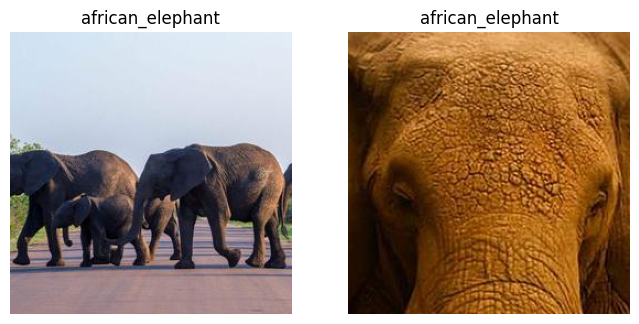

Displaying images for category: alpaca


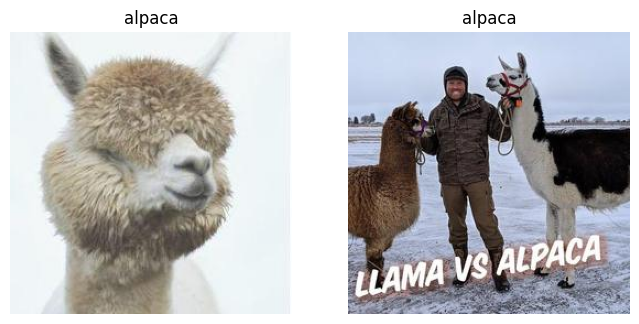

Displaying images for category: american_bison


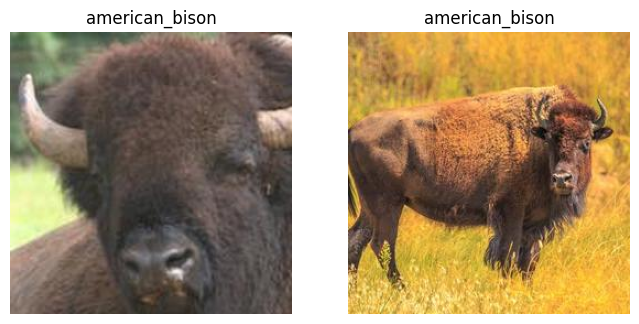

Displaying images for category: anteater


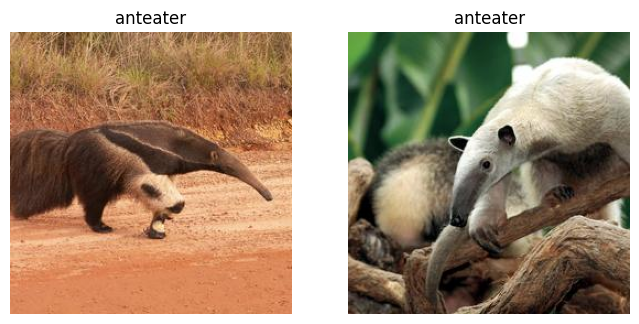

Displaying images for category: arctic_fox


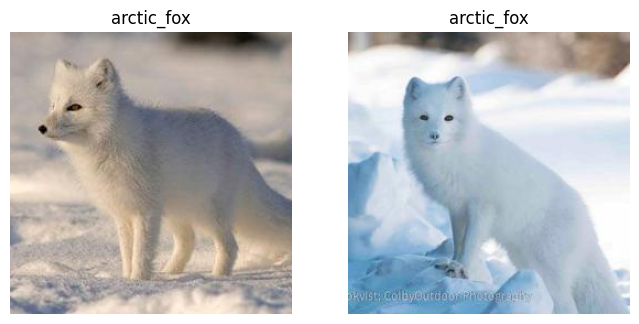

Displaying images for category: armadillo


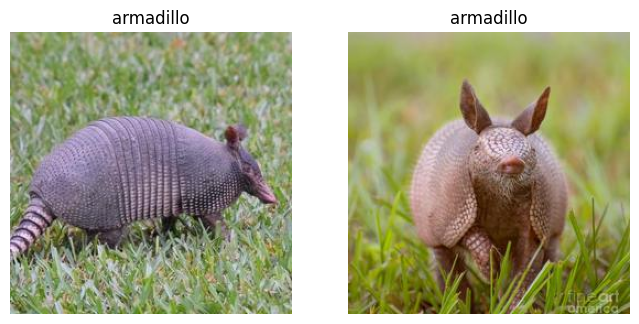

Displaying images for category: baboon


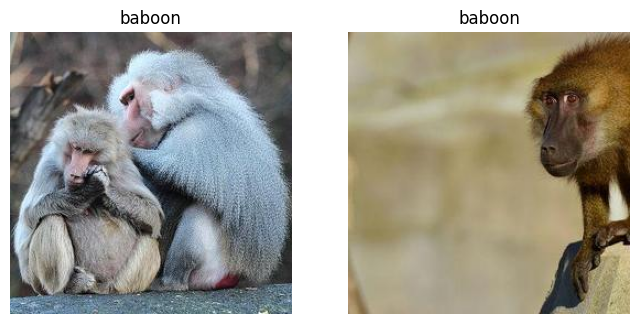

Displaying images for category: badger


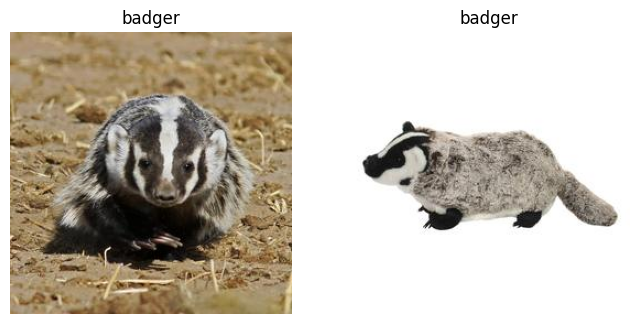

Displaying images for category: blue_whale


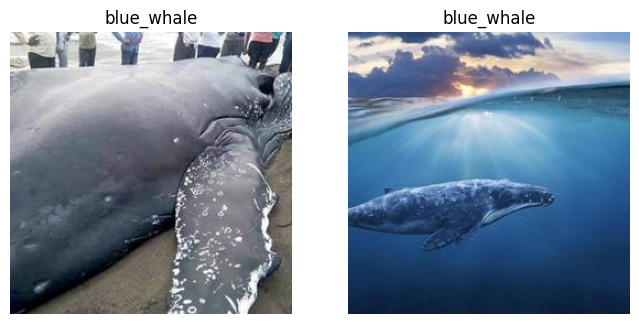

Displaying images for category: brown_bear


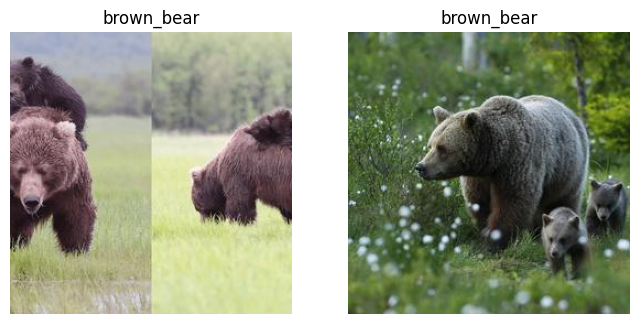

Displaying images for category: camel


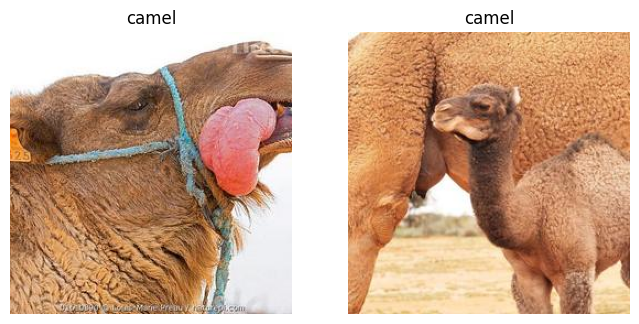

Displaying images for category: dolphin


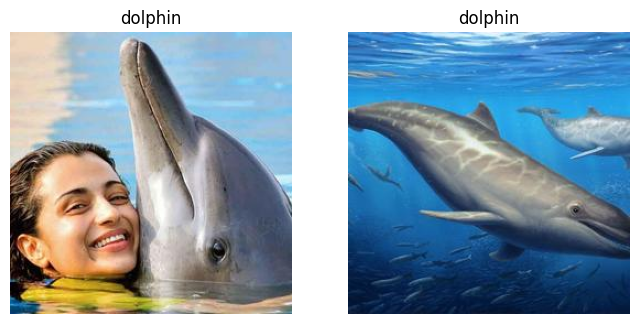

Displaying images for category: giraffe


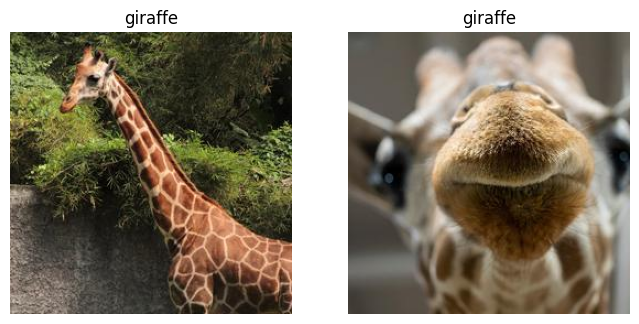

Displaying images for category: groundhog


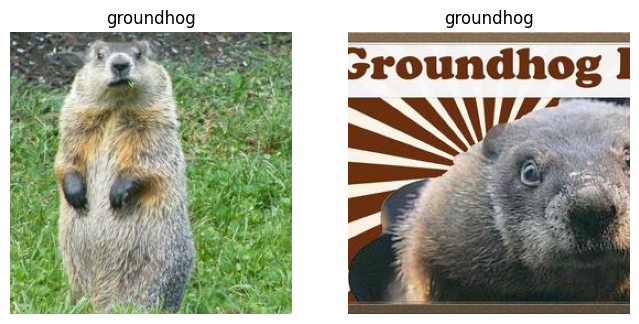

Displaying images for category: highland_cattle


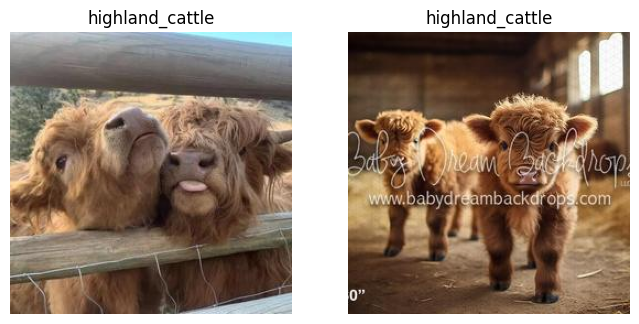

Displaying images for category: horse


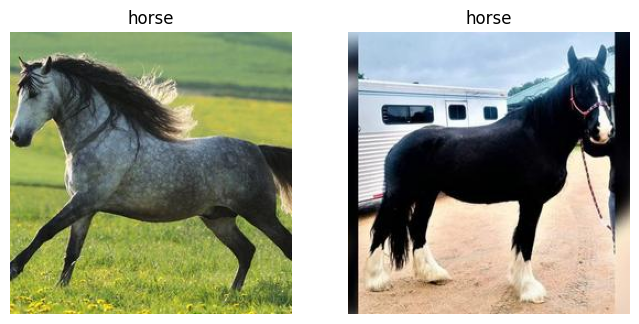

Displaying images for category: jackal


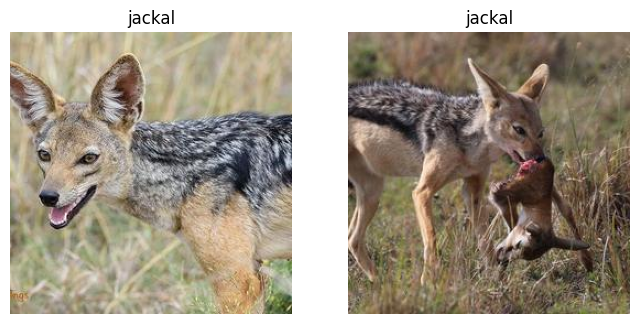

Displaying images for category: kangaroo


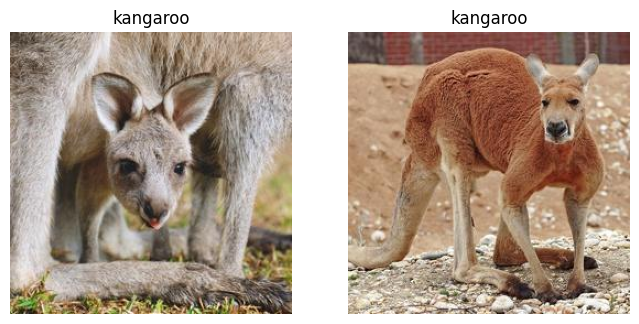

Displaying images for category: koala


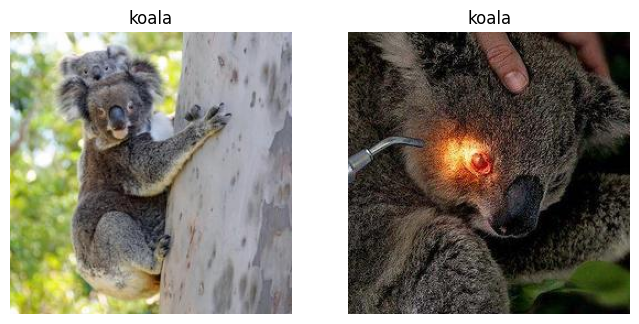

Displaying images for category: manatee


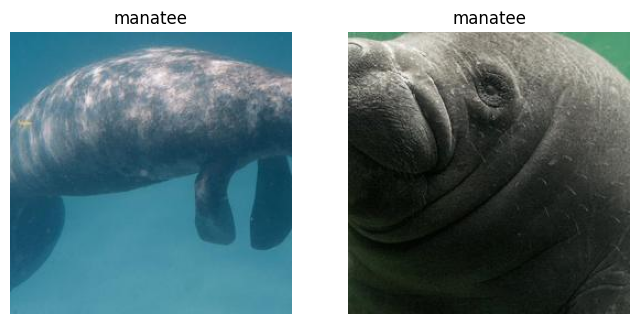

Displaying images for category: mongoose


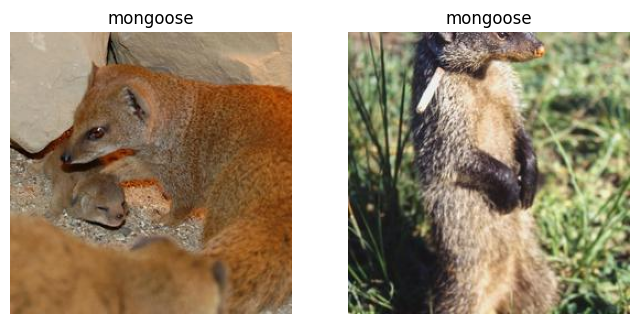

Displaying images for category: mountain_goat


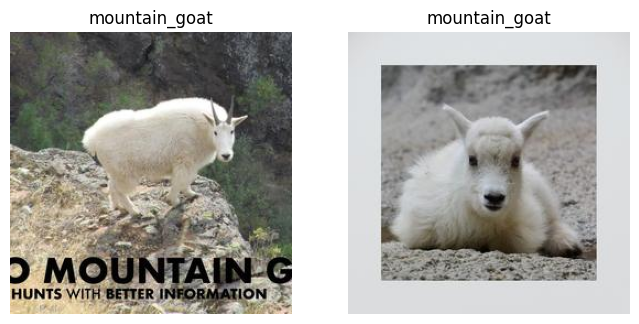

Displaying images for category: opossum


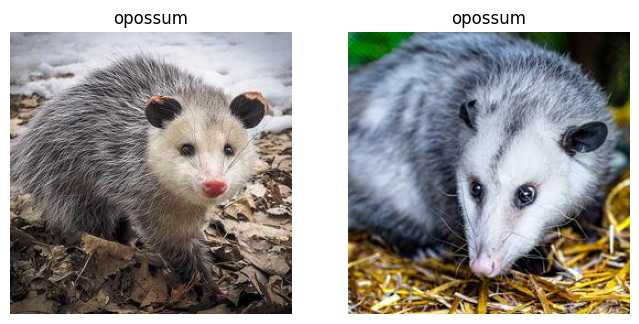

Displaying images for category: orangutan


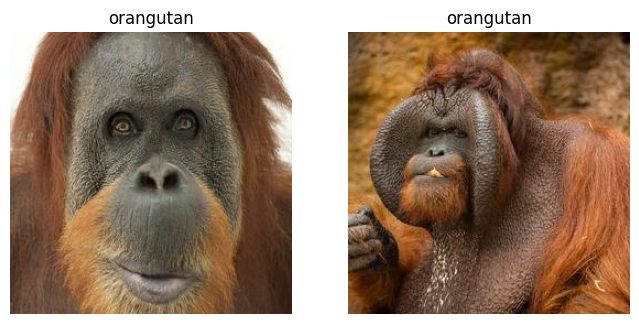

Displaying images for category: otter


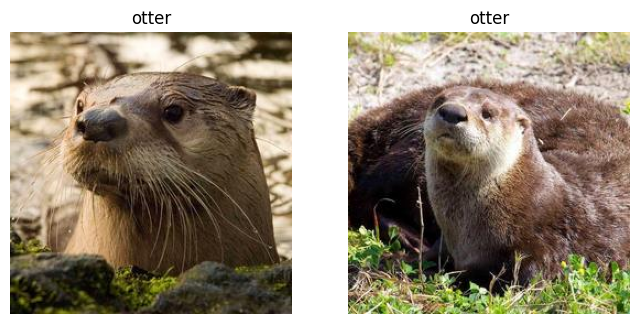

Displaying images for category: polar_bear


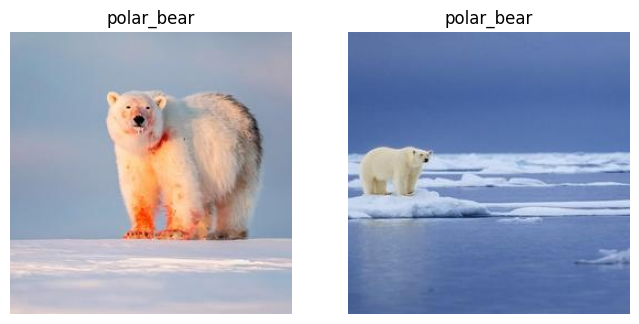

Displaying images for category: porcupine


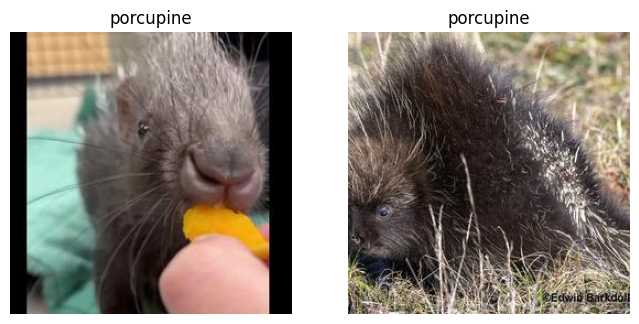

Displaying images for category: red_panda


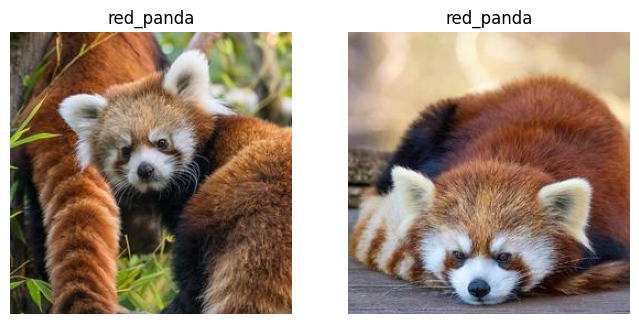

Displaying images for category: rhinoceros


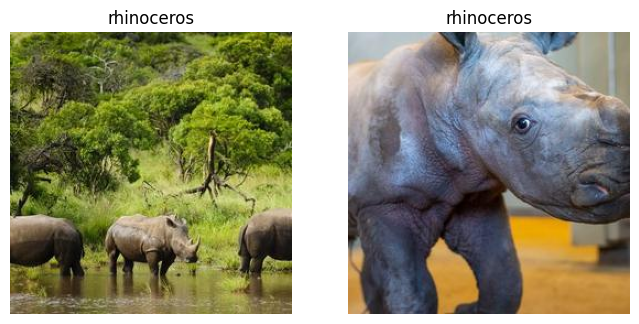

Displaying images for category: sea_lion


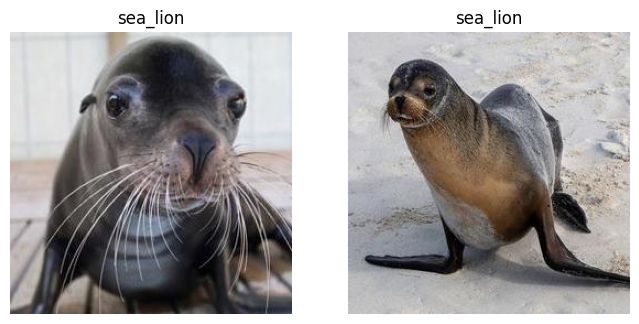

Displaying images for category: seal


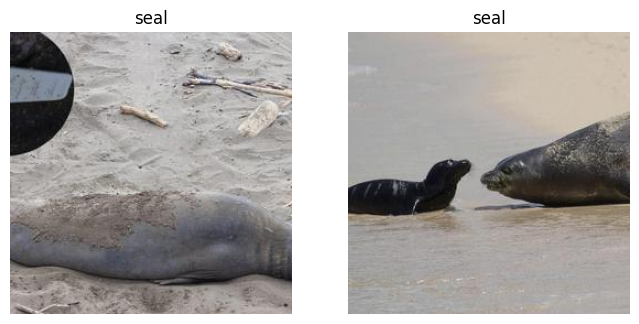

Displaying images for category: snow_leopard


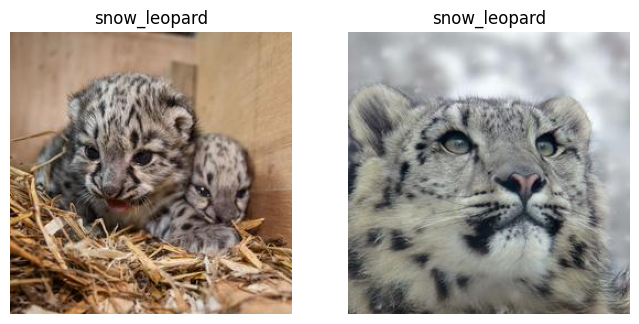

Displaying images for category: squirrel


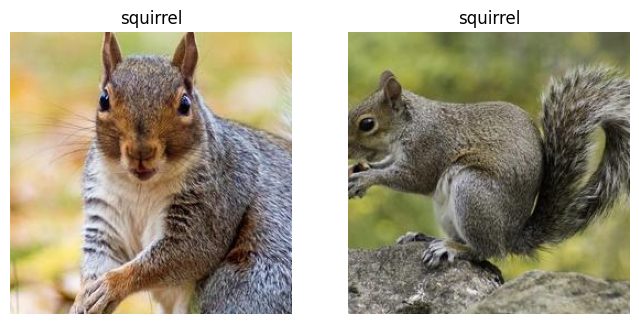

Displaying images for category: sugar_glider


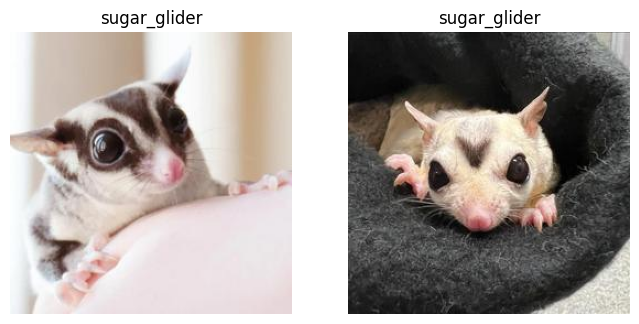

Displaying images for category: tapir


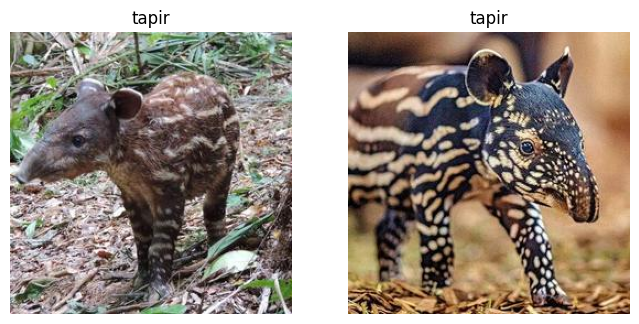

Displaying images for category: vampire_bat


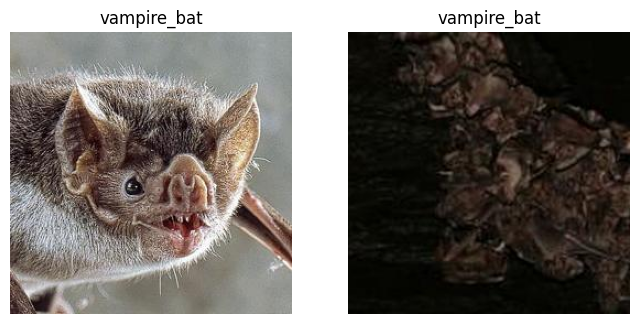

Displaying images for category: vicuna


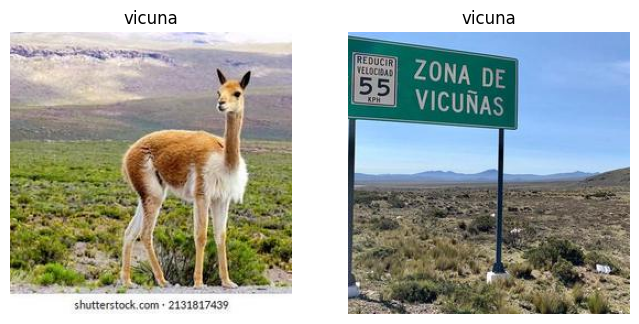

Displaying images for category: walrus


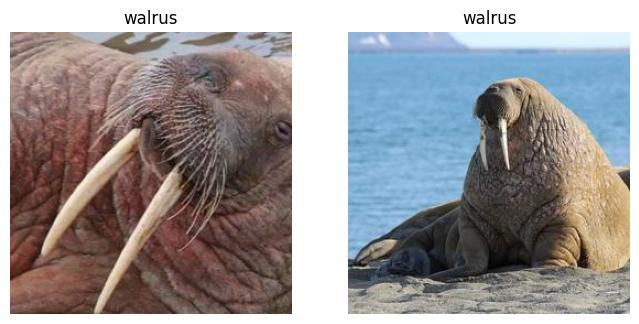

Displaying images for category: warthog


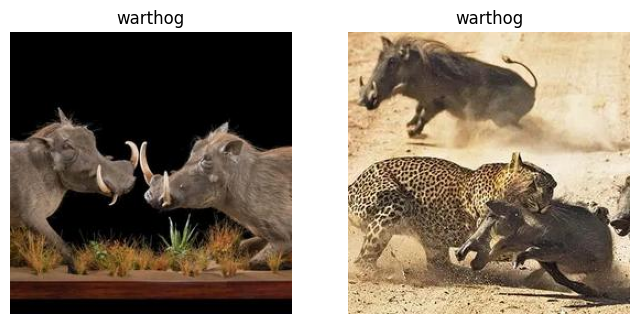

Displaying images for category: water_buffalo


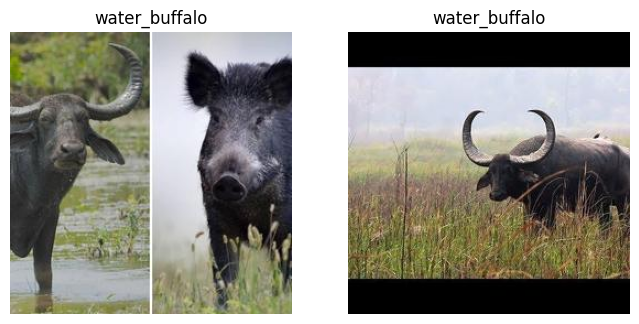

Displaying images for category: weasel


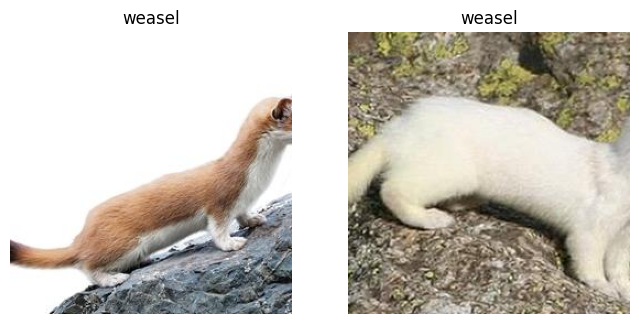

Displaying images for category: wildebeest


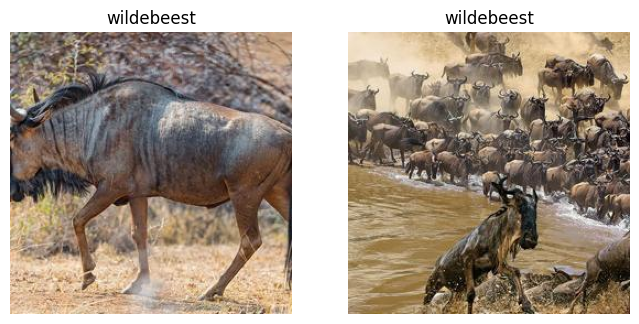

Displaying images for category: wombat


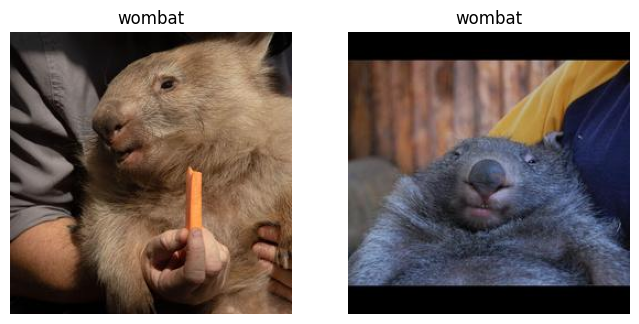

Displaying images for category: yak


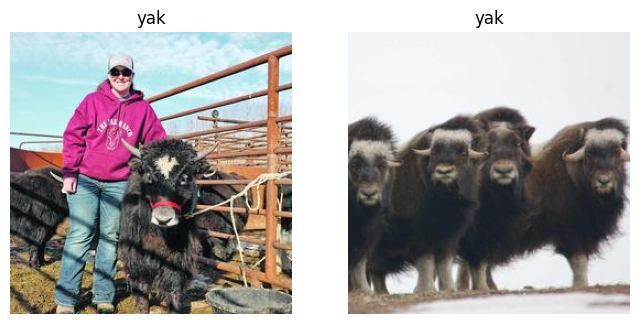

Displaying images for category: zebra


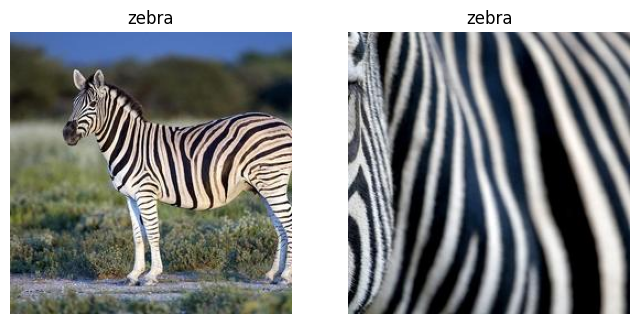

In [69]:
dataset_path = '/content/mammals_dataset/mammals'
images_to_display = 2

# Loop through each category in the dataset
for category in sorted(os.listdir(dataset_path)):
    if os.path.isdir(os.path.join(dataset_path, category)):
        print(f'Displaying images for category: {category}')

        # Initialize a counter to display a limited number of images per category
        counter = 0
        fig, axes = plt.subplots(1, images_to_display, figsize=(8, 6))

        # Loop through the images in the category
        for image_file in os.listdir(os.path.join(dataset_path, category)):
            if counter == images_to_display:
                break

            image_path = os.path.join(dataset_path, category, image_file)
            image = Image.open(image_path)
            axes[counter].imshow(image)
            axes[counter].axis('off')
            axes[counter].set_title(category)

            counter += 1

        plt.show()

In [70]:

# counting the directories to help us about the classes / labels

subdirectories =[f.path for f in os.scandir(dataset_path) if f.is_dir()]
len(subdirectories)

45

In [71]:
root_path = dataset_path
num_images = 0

# Iterate over each subdirectory
for dirpath, dirnames, filenames in os.walk(root_path): # absolute path
    # Count the number of image files in the current subdirectory
    for filename in filenames:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            num_images += 1

    # Print the number of image files in the current subdirectory
    print(f"Found {num_images} images in directory: {dirpath}")
    num_images = 0

Found 0 images in directory: /content/mammals_dataset/mammals
Found 215 images in directory: /content/mammals_dataset/mammals/vicuna
Found 309 images in directory: /content/mammals_dataset/mammals/groundhog
Found 328 images in directory: /content/mammals_dataset/mammals/mountain_goat
Found 254 images in directory: /content/mammals_dataset/mammals/yak
Found 305 images in directory: /content/mammals_dataset/mammals/giraffe
Found 239 images in directory: /content/mammals_dataset/mammals/vampire_bat
Found 333 images in directory: /content/mammals_dataset/mammals/manatee
Found 311 images in directory: /content/mammals_dataset/mammals/dolphin
Found 314 images in directory: /content/mammals_dataset/mammals/water_buffalo
Found 299 images in directory: /content/mammals_dataset/mammals/anteater
Found 278 images in directory: /content/mammals_dataset/mammals/jackal
Found 315 images in directory: /content/mammals_dataset/mammals/wombat
Found 315 images in directory: /content/mammals_dataset/mammal

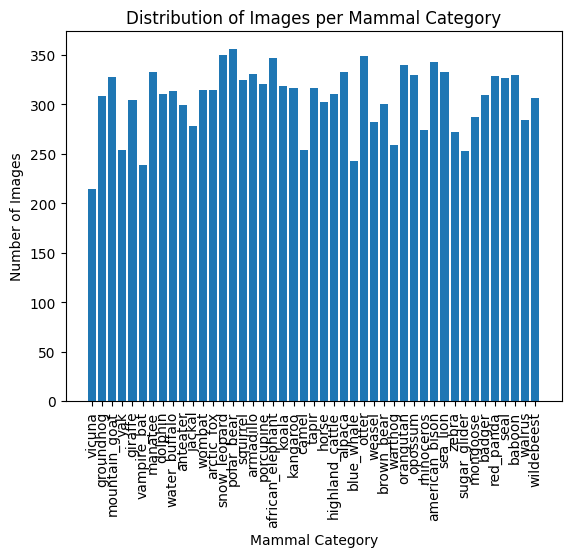

In [72]:
subdirectory_names = [d for d in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, d))]

# Initialize a list to count the number of images in each subdirectory
counts = []

# Count the number of images in each subdirectory
for subdirectory in subdirectory_names:
    directory_path = os.path.join(root_path, subdirectory)
    # Count files and consider only image files
    image_files = [file for file in os.listdir(directory_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]
    counts.append(len(image_files))

# Create a bar chart to visualize the distribution
plt.bar(subdirectory_names, counts)
plt.xticks(rotation=90)
plt.ylabel("Number of Images")
plt.xlabel("Mammal Category")
plt.title("Distribution of Images per Mammal Category")
plt.show()

Image valuable information about the characteristics of the images and helps us identify any patterns or anomalies within the dataset.properties to valuable information about
the characteristics of the images and helps us

In [73]:
sizes = []
resolutions = []
color_distributions = []

# Iterate over each image file in each subdirectory
for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            # Load the image file using OpenCV
            img_path = os.path.join(dirpath, filename)
            img = cv2.imread(img_path)

            # Extract the size of the image
            size = os.path.getsize(img_path)
            sizes.append(size)

            # Extract the resolution of the image
            resolution = img.shape[:2]
            resolutions.append(resolution)

            # Extract the color distribution of the image
            color_distribution = np.bincount(img.flatten(), minlength=256)
            color_distributions.append(color_distribution)

# Convert the lists to numpy arrays for easier manipulation
sizes = np.array(sizes)
resolutions = np.array(resolutions)
color_distributions = np.array(color_distributions)

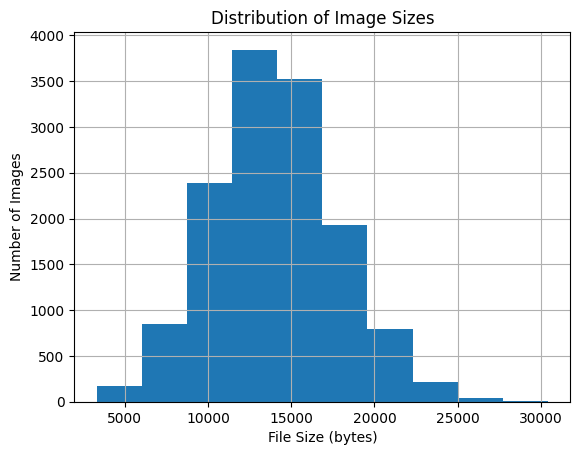

In [74]:
plt.hist(sizes)
plt.title("Distribution of Image Sizes")
plt.xlabel("File Size (bytes)")
plt.ylabel("Number of Images")
plt.grid()
plt.show()

In [77]:
sizes = []

# Iterate over each file in the root directory and its subdirectories
for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        # Get the full path of the file
        file_path = os.path.join(dirpath, filename)
        # Get the file size in bytes
        file_size = os.path.getsize(file_path)
        # Convert file size to MB and add to the list
        sizes.append(file_size / 1_000_000)

# Create a histogram figure with plotly
fig = px.histogram(x=sizes, nbins=50, title="Distribution of Image Sizes")

# Customize the plot
fig.update_layout(
    xaxis_title="File Size (MB)",
    yaxis_title="Number of Images",
    showlegend=False,
    bargap=0.1,
    bargroupgap=0.1
)

# Show the plot
fig.show()

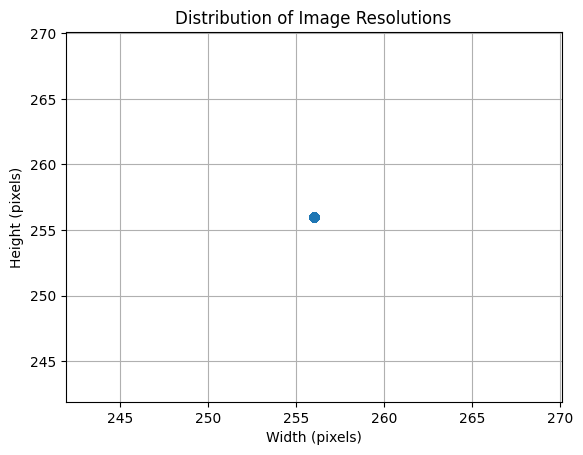

In [81]:
plt.scatter(resolutions[:, 0], resolutions[:, 1])
plt.title("Distribution of Image Resolutions")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.grid() # give us information our data images vals are 256 x 256 same data
plt.show()